<a href="https://colab.research.google.com/github/fabribara/DataScience/blob/main/Copy_of_10_morphological_operations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 10. Morphological Operations

## Table of Contents
1. [Libraries](#libraries)
2. [Erosion](#erosion)
3. [Dilation](#dilation)
4. [Opening](#opening)
5. [Closing](#closing)
6. [Morphological Gradient](#gradient)
7. [Morphological Hats](#hats)
   1. [Top or White Hat](#top)
   1. [Black Hat](#black)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Importing Libraries <a class="anchor" id="libraries" ></a>

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
img = cv2.imread("/content/drive/MyDrive/Colab Notebooks/TC4033.10_VisionComputacional/Tarea_4.2/imagenes/lago.jpg")
img1 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img2 = cv2.imread("/content/drive/MyDrive/Colab Notebooks/TC4033.10_VisionComputacional/Tarea_4.2/imagenes/lago.jpg",0)

(800, 1200, 3) (800, 1200, 3) (800, 1200)


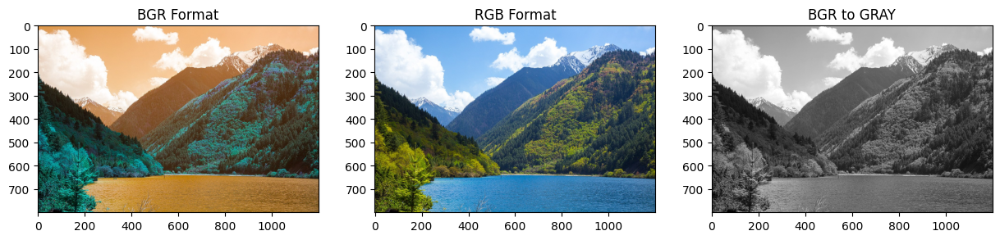

In [ ]:
#function to see image
def imgshow(img=img,img1=img1,img2=img2, rows=1,columns=3):
    print(img.shape,img1.shape,img2.shape)
    fig = plt.figure(figsize=(15,8))
    #adds a subplot at 1st position
    fig.add_subplot(rows,columns,1)
    plt.title('BGR Format')
    plt.imshow(img)

    #adds a subplot at 2nd position
    fig.add_subplot(rows,columns,2)
    plt.title('RGB Format')
    plt.imshow(img1)

    #adds a subplot at 3rd position
    fig.add_subplot(rows,columns, 3)
    plt.title('BGR to GRAY')
    plt.imshow(img2,cmap="gray")
    plt.show()

imgshow(img=img,img1=img1,img2=img2, rows=1,columns=3)

## Erosion <a class="anchor" id="erosion" ></a>

Erosin primarily involves eroding(thinning) outer surface(foreground) of image
- Tt is suggested to have foreground as white

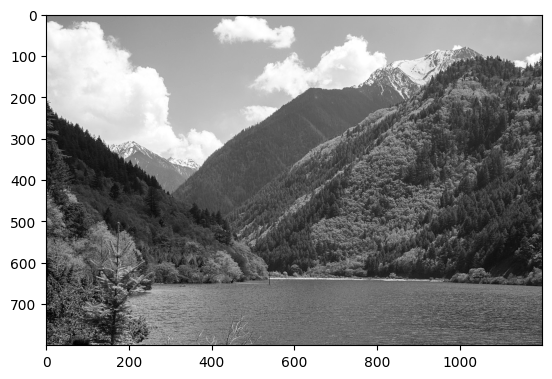

In [ ]:
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
plt.imshow(BGR2GRAY,cmap="gray")
plt.show()

Eroding boundy of image upto 3 level

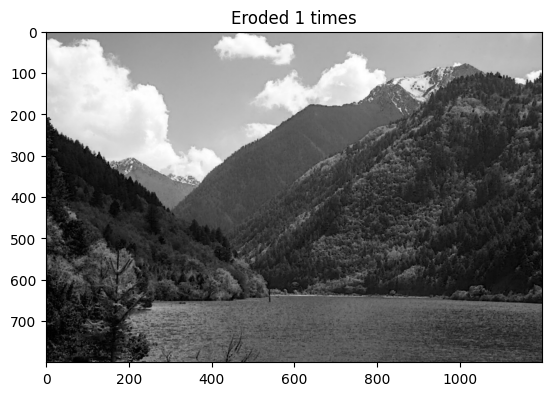

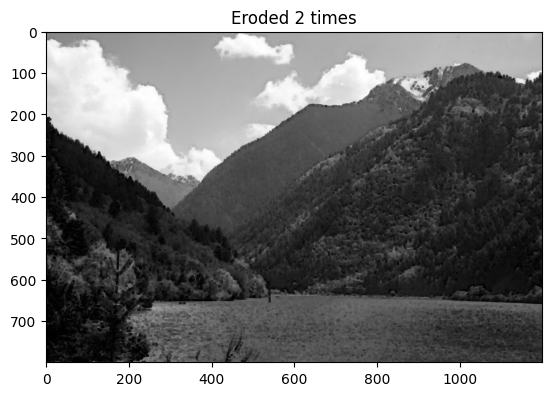

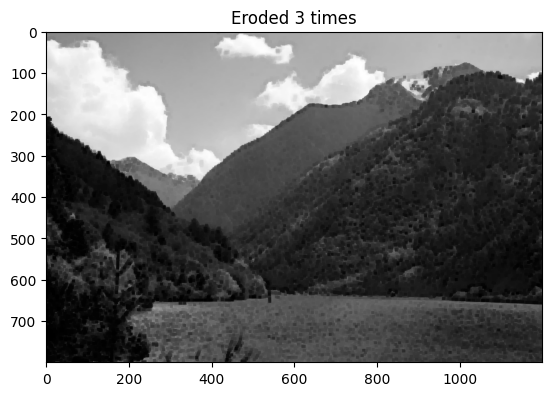

In [ ]:
def plt_imshow(title, image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.title(title)
    plt.grid(False)
    plt.show()

for i in range(0,3):
    eroded = cv2.erode(BGR2GRAY.copy(), None, iterations=i+1)
    plt_imshow("Eroded {} times".format(i+1), eroded)

### Binarize Image

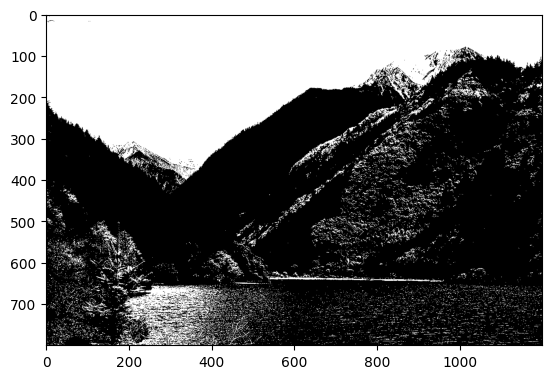

In [ ]:
binr = cv2.threshold(BGR2GRAY, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
image = cv2.cvtColor(binr, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

### We can Invert Image to keep foreground in white

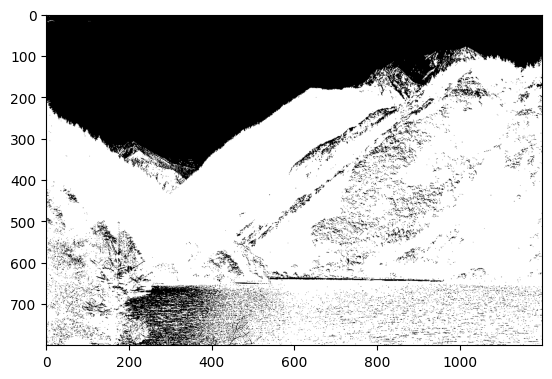

In [ ]:
invert = cv2.bitwise_not(binr)
image = cv2.cvtColor(invert, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

Then, we can define a kernel of $5 \times 5$ to use in erosion

In [ ]:
kernel = np.ones((3,3), np.uint8) #check for 3*3 or 7*7 kernel size too
print(kernel)

[[1 1 1]
 [1 1 1]
 [1 1 1]]


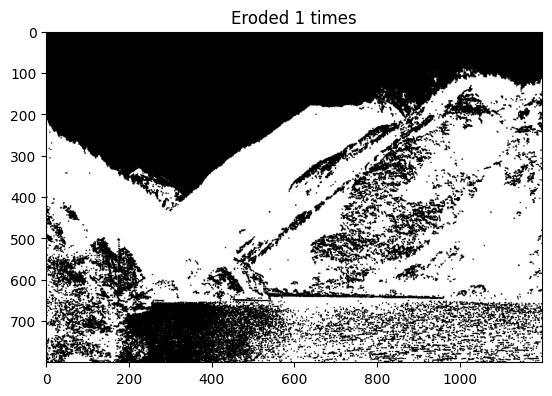

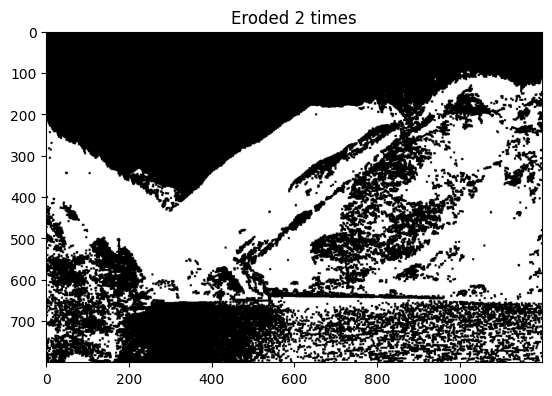

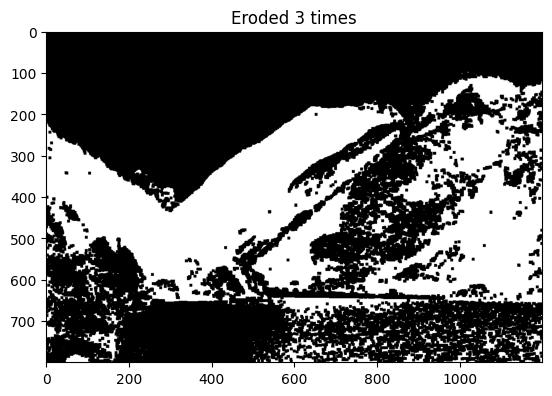

In [ ]:
for i in range(0,3):
    eroded = cv2.erode(invert.copy(),kernel=kernel, iterations=i+1)
    plt_imshow("Eroded {} times".format(i+1), eroded)

## Dilation <a class="anchor" id="dilation" ></a>

Involves dilating outer surface (foreground) of image
- For joining broken parts of an image together

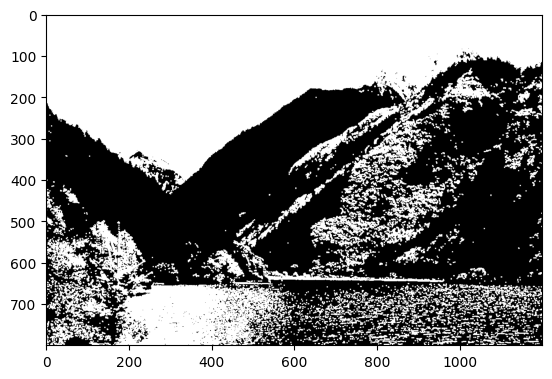

In [ ]:
#binarize image
binr = cv2.threshold(BGR2GRAY,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
kernel = np.ones((3,3),np.uint8)
invert = cv2.bitwise_not(binr)

#dilate image
dilation = cv2.dilate(binr, kernel, iterations=1)

plt.imshow(dilation, cmap='gray')
plt.show()

We can apply series of dilations on inverted image using no kernel


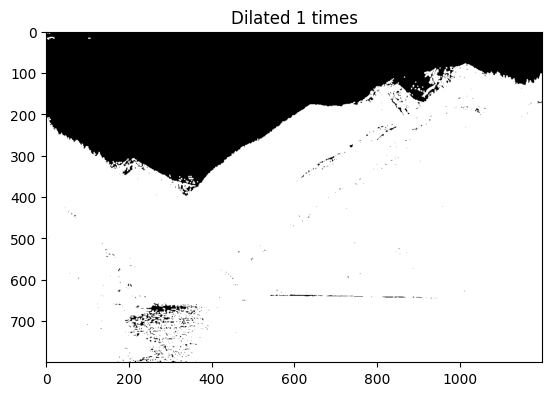

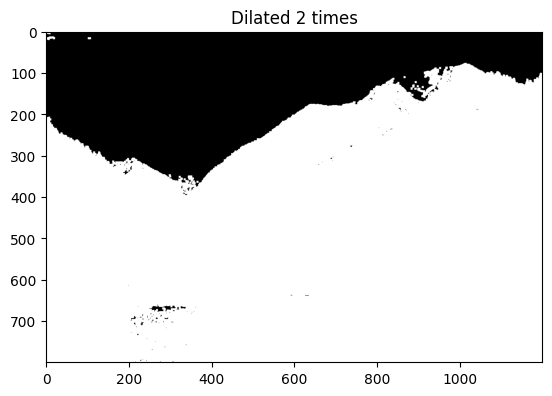

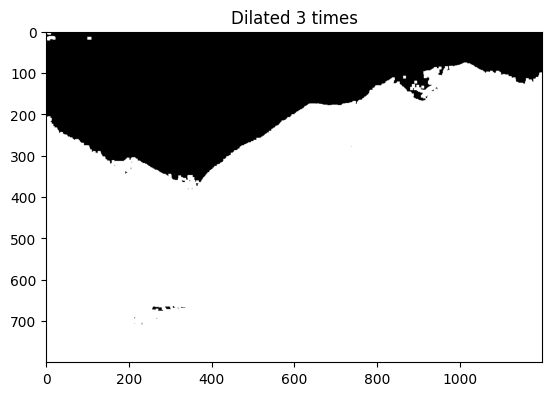

In [ ]:
for i in range(0,3):
    dilated = cv2.dilate(invert.copy(),None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),dilated)

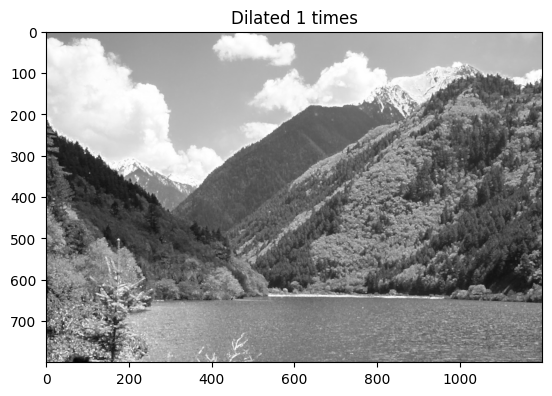

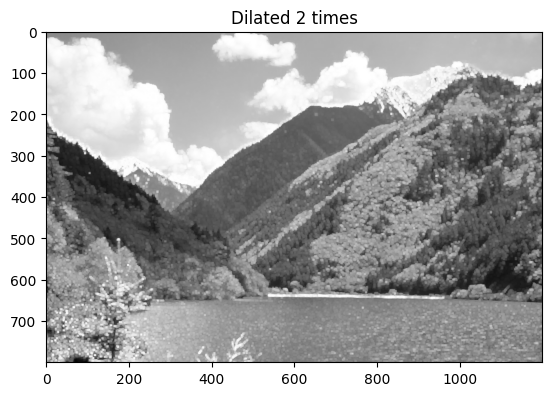

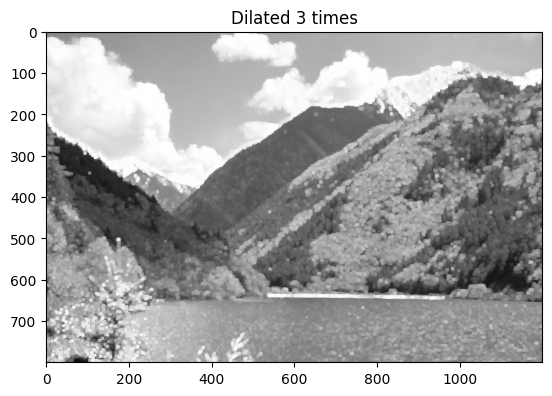

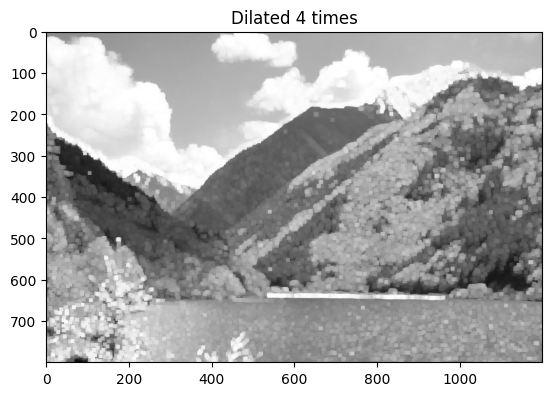

In [ ]:
for i in range(0,4):
    dilated = cv2.dilate(BGR2GRAY.copy(),None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),dilated)

## Opening <a class="anchor" id="opening" ></a>

Erosion followed by dilation in outer surface (foreground) of image
- Generally used to remove noise (small blobs) in image


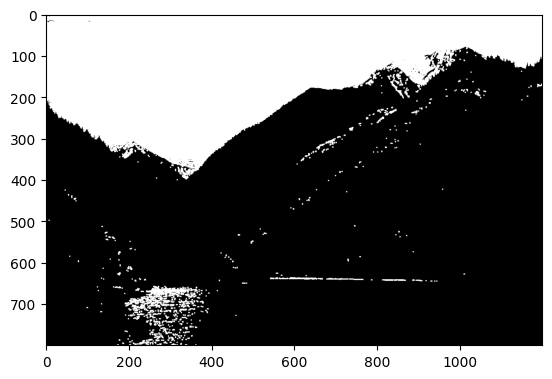

In [ ]:
#opening image
opening = cv2.morphologyEx(binr,cv2.MORPH_OPEN,kernel,iterations=1)

#print output
plt.imshow(opening, cmap='gray')
plt.show()

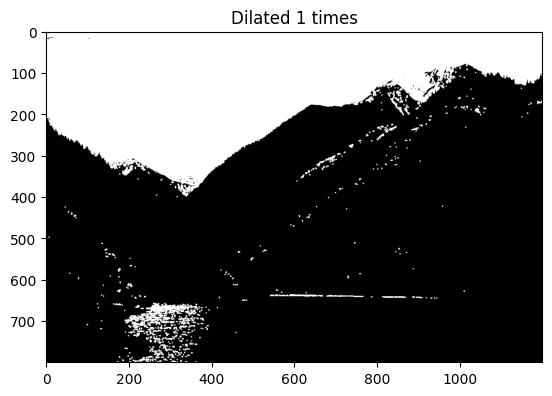

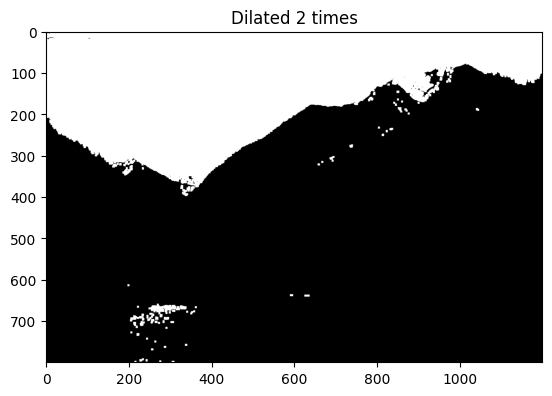

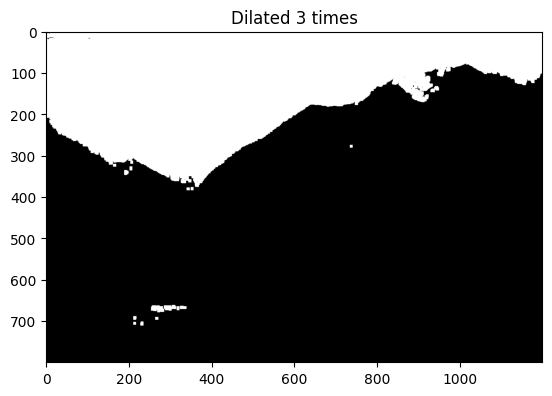

In [ ]:
for i in range(0,3):
    opening = cv2.morphologyEx(binr.copy(),cv2.MORPH_OPEN,None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),opening)
    plt.show()

## Closing <a class="anchor" id="closing" ></a>

Dilation followed by erosion in outer surface (foreground) of image
- Generally used to close holes inside of objects or for connecting components together

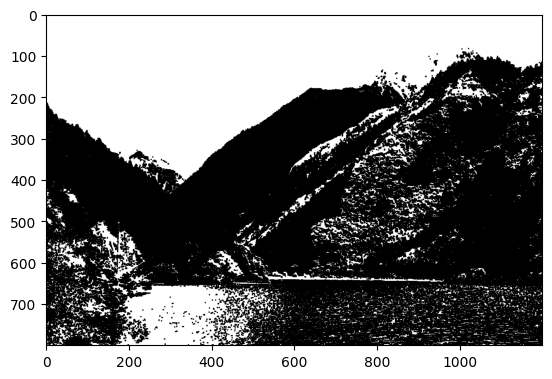

In [ ]:
#closing image
closing = cv2.morphologyEx(binr, cv2.MORPH_CLOSE, kernel, iterations=1)

#print output
plt.imshow(closing,cmap='gray')
plt.show()

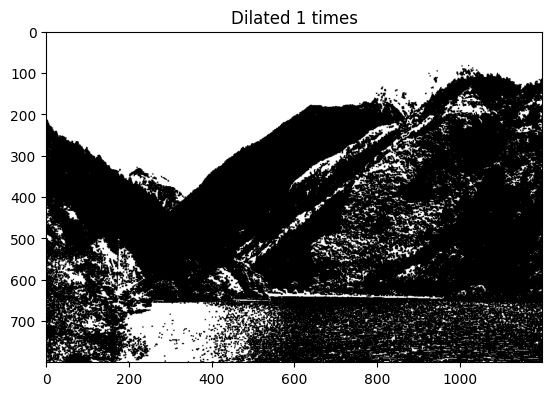

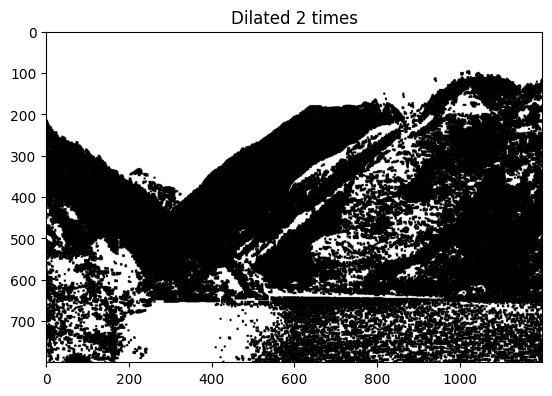

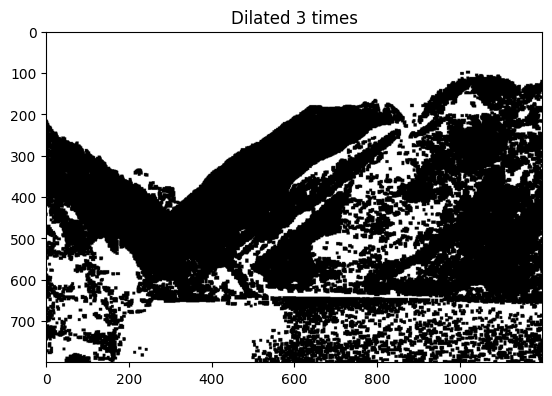

In [ ]:
for i in range(0,3):
    closing = cv2.morphologyEx(binr.copy(),cv2.MORPH_CLOSE,None,iterations= i+1)
    plt_imshow("Dilated {} times".format(i+1),closing)
    plt.show()

Iterating with different kernels

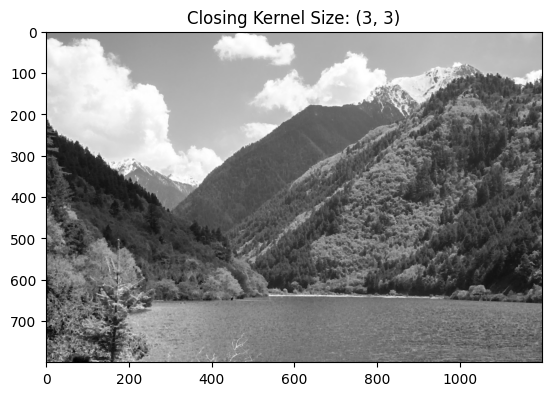

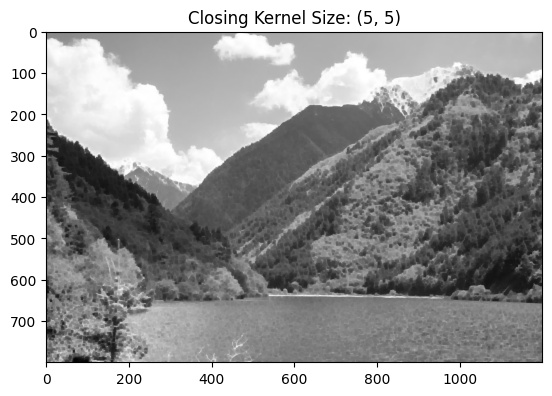

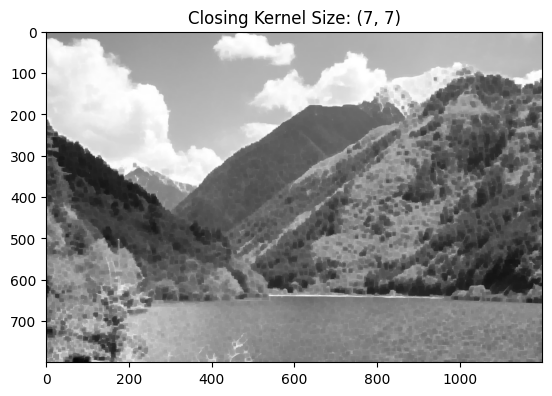

In [ ]:
kernelSizes = [(3,3), (5,5), (7,7)]
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

for kernelSize in kernelSizes:
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernelSize)
    closing = cv2.morphologyEx(BGR2GRAY, cv2.MORPH_CLOSE, kernel)
    plt_imshow("Closing Kernel Size: ({}, {})".format(kernelSize[0], kernelSize[1]), closing)

## Morphological Gradient <a class="anchor" id="gradient" ></a>

It first applies erosion and dilation individually on image and then computes difference between eroded and dilated image

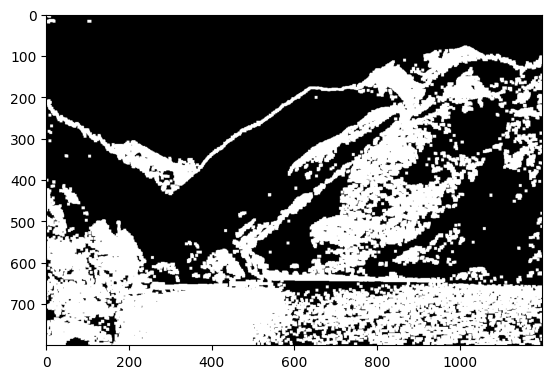

In [ ]:
# use morph gradient
morph_gradient = cv2.morphologyEx(invert,cv2.MORPH_GRADIENT,kernel)

#print output
plt.imshow(morph_gradient, cmap='gray')
plt.show()

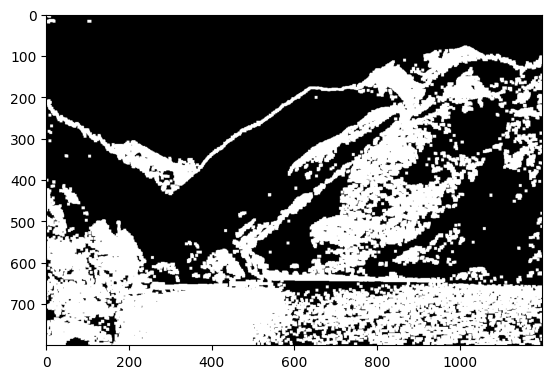

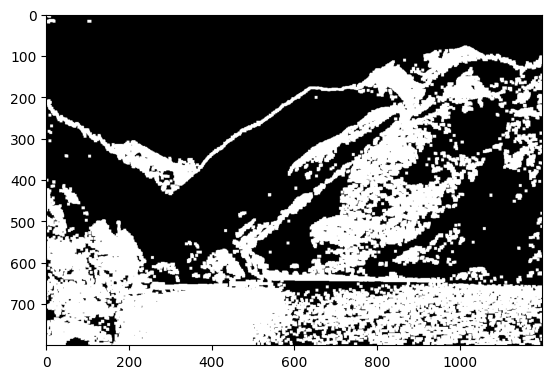

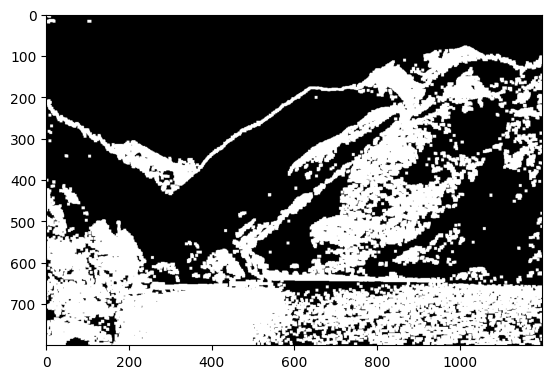

In [ ]:
for i in range(0,3):
    # use morph gradient
    morph_gradient = cv2.morphologyEx(invert,cv2.MORPH_GRADIENT,kernel+i)
    #print output
    plt.imshow(morph_gradient, cmap='gray')
    plt.show()

Iterating with different kernels

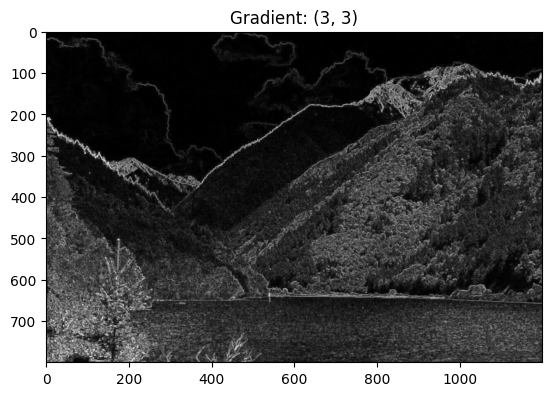

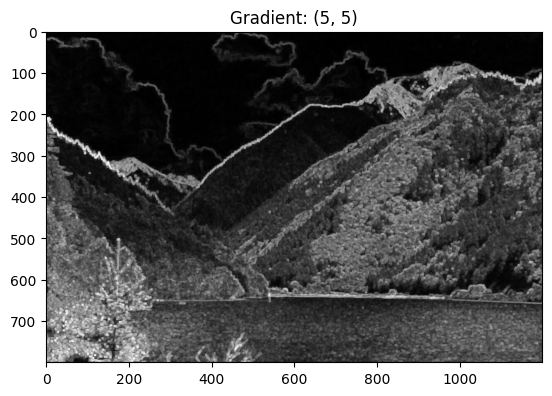

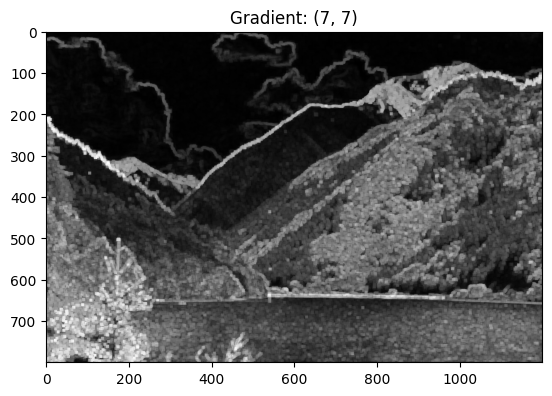

In [ ]:
kernelSizes = [(3,3), (5,5), (7,7)]
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

for kernelSize in kernelSizes:
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, kernelSize)
    gradient = cv2.morphologyEx(BGR2GRAY, cv2.MORPH_GRADIENT, kernel)
    plt_imshow("Gradient: ({}, {})".format(
        kernelSize[0], kernelSize[1]), gradient)

## Morphological Hats <a class="anchor" id="hats" ></a>

1. Top or White Hat
2. Black hat

### Top or White Hat <a class="anchor" id="top" ></a>

It is the difference between original (grayscale/single channel) input image and opening image

- Finds light(bright) regions of an image on dark background


In [ ]:
#construct a kernel (13x5)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(13,5))
kernel

array([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
       [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]], dtype=uint8)

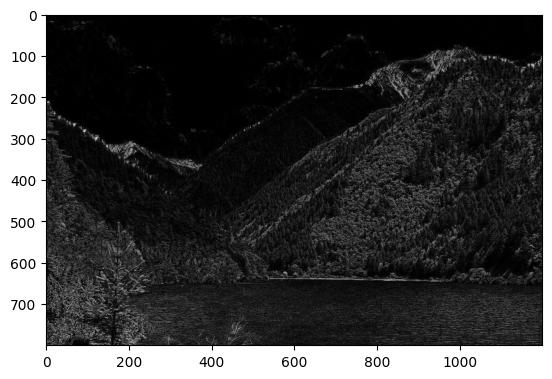

In [ ]:
tophat = cv2.morphologyEx(BGR2GRAY, cv2.MORPH_TOPHAT, kernel)

plt.imshow(tophat, cmap='gray')
plt.show()

### Black Hat <a class="anchor" id="black" ></a>

Output is a difference between input image & opened image
- Finds dark regions on a light background


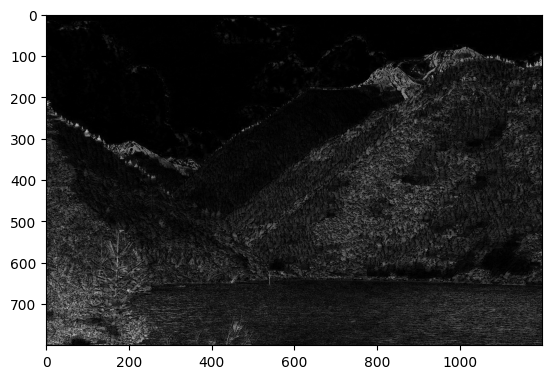

In [ ]:
blackhat = cv2.morphologyEx(BGR2GRAY,cv2.MORPH_BLACKHAT,kernel)

plt.imshow(blackhat, cmap='gray')
plt.show()

# Tarea

### Ejercicio 1: Investigar una aplicación de erosión en procesamiento de imágenes e implementarlo en Colab

Erosion

Es una operación morfológica por la cual, el píxel de la imagen correspondiente al origen del elemento estructurante en una ventana donde cualquier píxel en la ventana de imagen definido por la estructuración

El elemento es uno se establece en uno y se establece en cero en todos los demás casos. Por tanto, es útil para eliminar el pepper noise, pero también aumenta el tamaño de los objetos en la imagen.

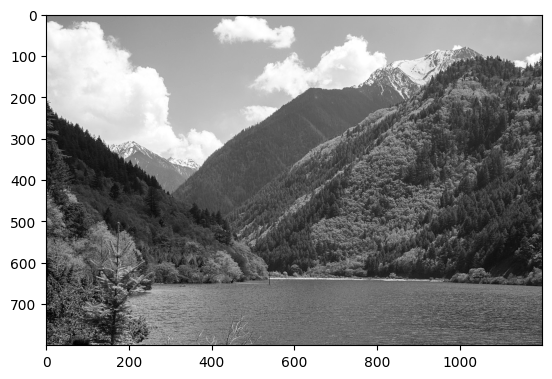

In [ ]:
img = cv2.imread("/content/drive/MyDrive/Colab Notebooks/TC4033.10_VisionComputacional/Tarea_4.2/imagenes/lago.jpg")
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
plt.imshow(BGR2GRAY,cmap="gray")
plt.show()

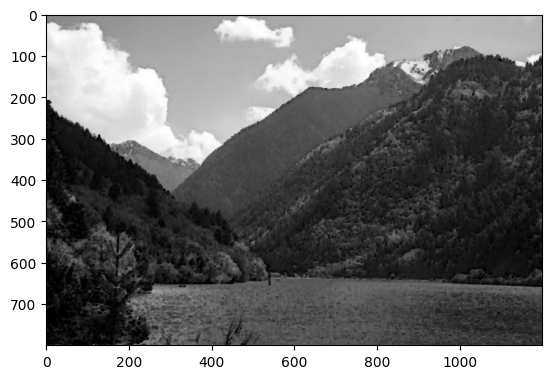

In [ ]:
kernel = np.ones((5,5), np.uint8)
eroded = cv2.erode(BGR2GRAY.copy(),kernel=kernel, iterations=1)
plt.imshow(eroded,cmap="gray")

### Ejercicio 2: Investigar una aplicación de dilatación en procesamiento de imágenes e implementarlo en Colab

Dilatacion

Es una operación morfológica por la cual, el píxel de la imagen correspondiente al origen del elemento estructurante en una ventana donde la imagen en la ventana definido por el elemento estructurante son todos unos se establece en uno y se establece en cero en todos los demás casos. Por tanto, es útil para eliminar el salt noise, pero también reduce el tamaño de los objetos en la imagen.

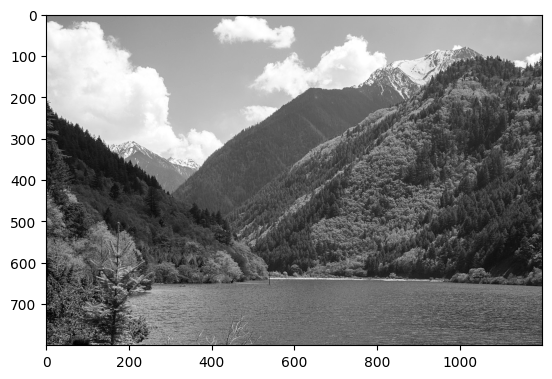

In [ ]:
img = cv2.imread("/content/drive/MyDrive/Colab Notebooks/TC4033.10_VisionComputacional/Tarea_4.2/imagenes/lago.jpg")
BGR2GRAY = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
plt.imshow(BGR2GRAY,cmap="gray")
plt.show()

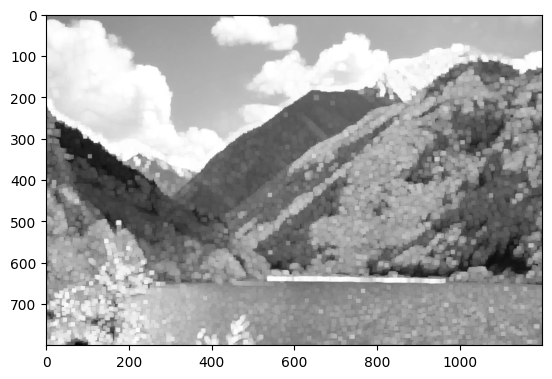

In [ ]:
kernel = np.ones((10,10), np.uint8)
dilated = cv2.dilate(BGR2GRAY.copy(),kernel=kernel, iterations=1)
plt.imshow(dilated,cmap="gray")
plt.show()

### Ejercicio 3: Investigar una aplicación de opening y closing e implementalo en Google Colab

Opening

Una operación de erosión seguida de una operación de dilatación de la imagen da como resultado un opening. Ya que ambas operaciones disminuyen y aumentan el tamaño del objeto, se deja sin cambios después de ambas operaciones se realizan en secuencia. Esta operación elimina el salt noise y conserva el tamaño del objeto.


Closing

Una operación de dilatación seguida de una operación de erosión de la imagen da como resultado un closing. Ya que ambasa operaciones disminuyen y aumentan el tamaño del objeto, se deja sin cambios después de ambas operaciones
se realizan en secuencia. Esta operación elimina el pepper noise y conserva el tamaño del objeto.

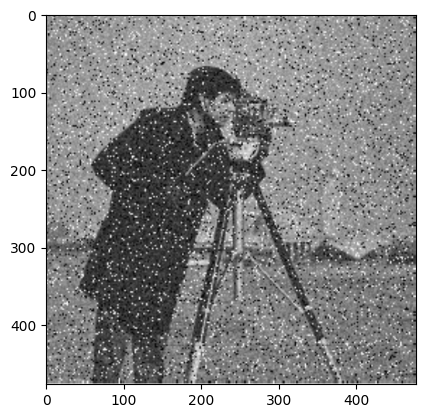

In [ ]:
img = cv2.imread("/content/drive/MyDrive/Colab Notebooks/TC4033.10_VisionComputacional/Tarea_4.2/imagenes/cameraman.png")
BGR2GRAY = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(BGR2GRAY,cmap="gray")
plt.show()

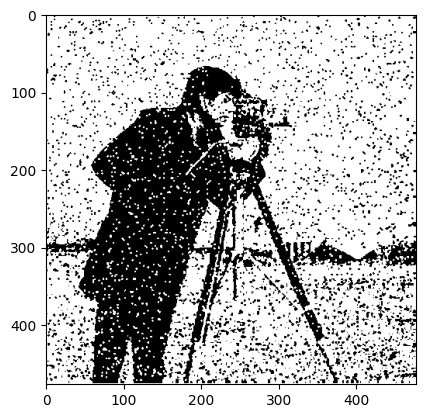

In [ ]:
#binr = cv2.threshold(BGR2GRAY, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
#binr = cv2.threshold(BGR2GRAY, 98, 255, cv2.THRESH_BINARY)[1]
binr = cv2.threshold(BGR2GRAY, 0, 255, cv2.THRESH_OTSU)[1]
image = cv2.cvtColor(binr, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

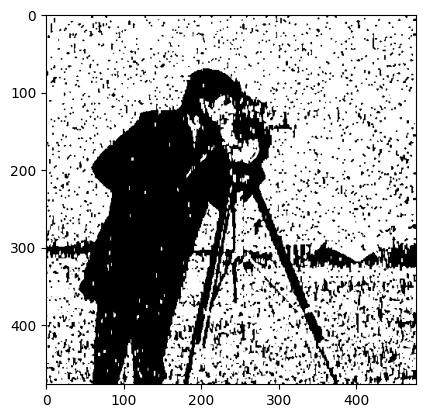

In [ ]:
# defining kernel
kernel_opening = np.ones((2,1),np.uint8)

#opening image
opening = cv2.morphologyEx(binr,cv2.MORPH_OPEN,kernel_opening,iterations=3)

#print output
plt.imshow(opening, cmap='gray')
plt.show()

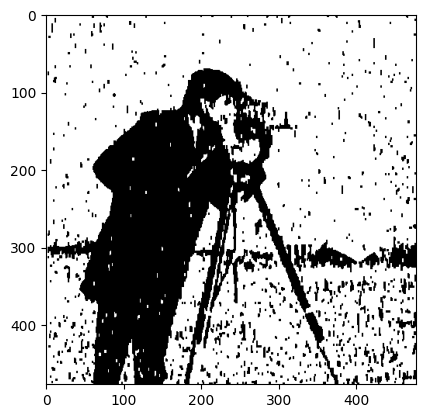

In [ ]:
# defining kernel
kernel_closing = np.ones((3,2),np.uint8)

#closing image
closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel_closing, iterations=1)

#print output
plt.imshow(closing,cmap='gray')
plt.show()

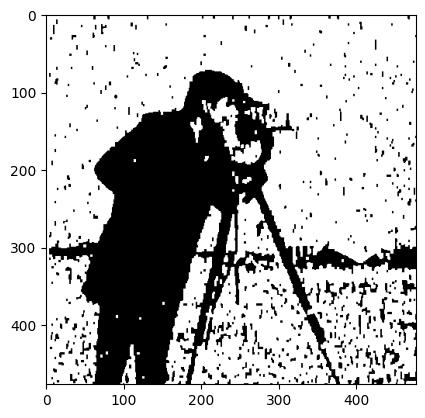

In [ ]:
# defining kernel
kernel_opening2 = np.ones((2,2),np.uint8)

#opening image
opening = cv2.morphologyEx(closing,cv2.MORPH_OPEN,kernel_opening2,iterations=2)

#print output
plt.imshow(opening, cmap='gray')
plt.show()

Conclusiones Ejercicio 3: Opening y Closing son operaciones morfológicas utilizadas muy a menudo de forma combinada cómo filtros para alizar las imágenes y remover ruido. El objetivo de esta imagen fue a través de una combinación opening -- closing -- opening, remover el ruido por completo del fotografo y tratando de conservar sus facciones faciales lo más posible.\
Se estuvo jugando con diferentes tamaños de kernel e iteraciones hasta encontrar la combinación que más nos gustó.  

## Aplicación que engloba los tres ejercicios anteriores

La retinopatía diabética (RD) daña los vasos sanguíneos de la retina del ojo y provoca deficiencia visual.
La apariencia y estructura de los vasos sanguíneos en las imágenes de la retina juegan un papel esencial en el diagnóstico de enfermedades oculares.

Esta aplicacion Propone una técnica automatizada no supervisado menos computacional con resultados prometedores para la detección de la vasculatura retiniana mediante el uso de enfoque basado en operadores morfologicos y umbral de Otsu basado en regiones. Contraste limitado
Se han utilizado ecualización de histograma adaptativo (CLAHE) y filtros morfológicos para mejorar y eliminar ruido de baja frecuencia u objetos geométricos, respectivamente.

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
import cv2
import glob
import copy
%matplotlib inline
import skimage.filters
import skimage.exposure
import skimage.filters.rank
import skimage.morphology
import scipy.ndimage
import os
import matplotlib.image as img
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from skimage.filters import hessian
from skimage import morphology

In [ ]:
link = []
link = glob.glob('/content/drive/MyDrive/Colab Notebooks/TC4033.10_VisionComputacional/Tarea_4.2/dataset/*.ppm')

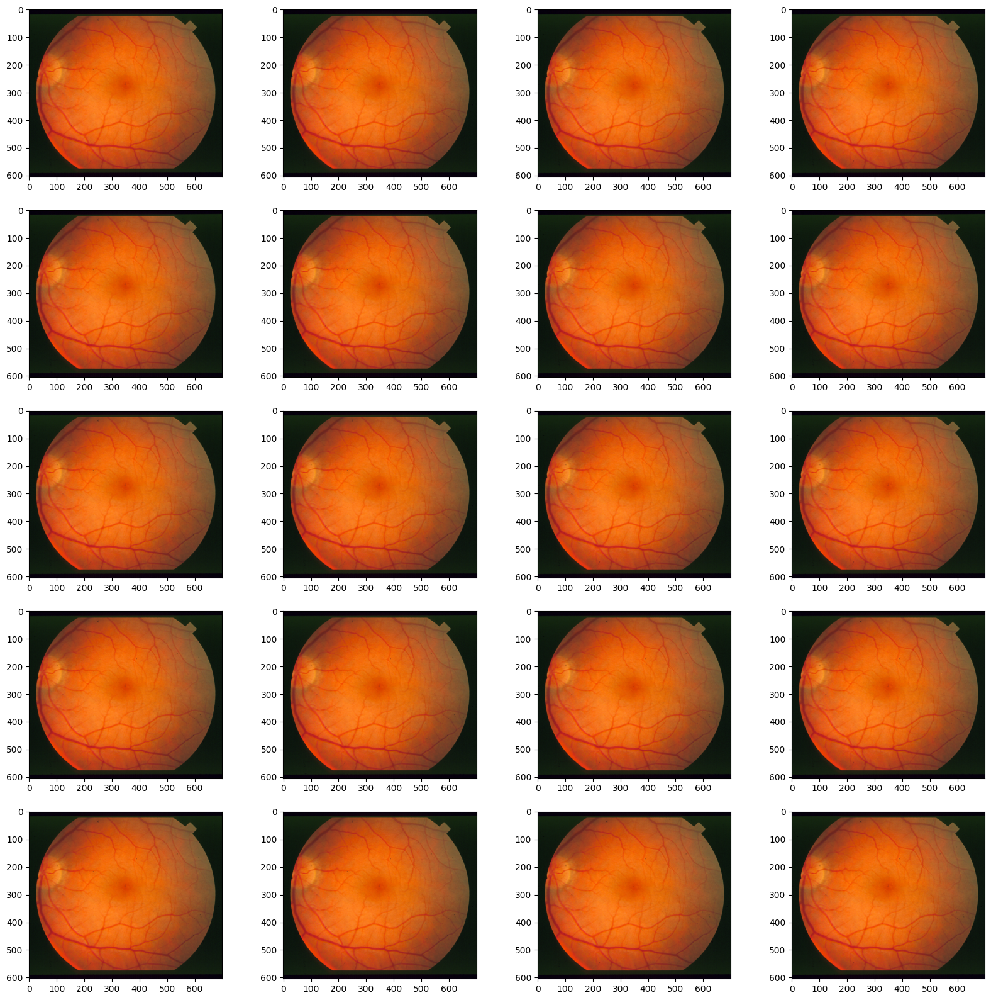

In [ ]:
#revisando los datos de entrada
rows = 5
columns = 4
fig = plt.figure(figsize=(20, 20))
for i in range(1, 21):
    fig.add_subplot(rows, columns, i)
    img = cv2.imread(link[1])
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img,cmap='gray')

plt.show()

In [ ]:
print(img.shape)

(605, 700, 3)


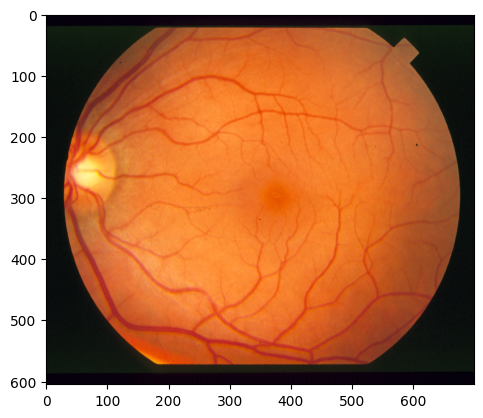

In [ ]:
url = "/content/drive/MyDrive/Colab Notebooks/TC4033.10_VisionComputacional/Tarea_4.2/dataset/im0007.ppm"
img = cv2.imread(url)
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
plt.imshow(img)

In [ ]:
#Separando en diferentes canales RGB
imgR = img[:,:,0]
imgG = img[:,:,1]
imgB = img[:,:,2]

Text(0.5, 1.0, 'Blue Channel')

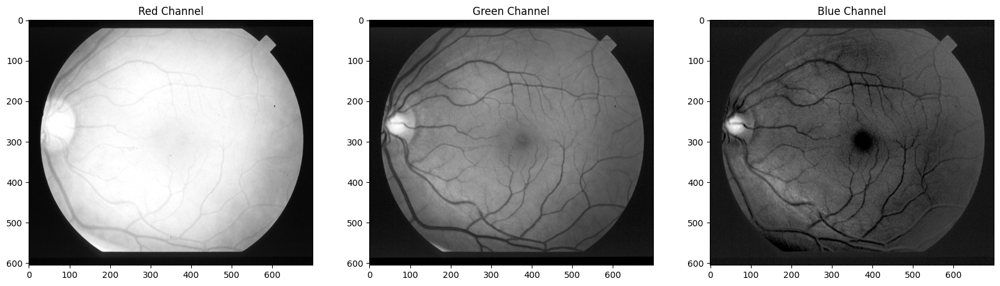

In [ ]:
#Graficando los diferentes canales
fig = plt.figure(figsize=(20, 10))
fig.add_subplot(1, 3, 1)
plt.imshow(imgR,cmap='gray')
plt.title('Red Channel')
fig.add_subplot(1, 3, 2)
plt.imshow(imgG,cmap='gray')
plt.title('Green Channel')
fig.add_subplot(1, 3, 3)
plt.imshow(imgB,cmap='gray')
plt.title('Blue Channel')

In [ ]:
#Funcion de histograma, regresa una lista de frecuencias
def drawHistogram(img):
    his = np.zeros(256,)
    a = img.flatten()
    for i in a:
        his[i] = his[i]+1
    return his

(array([   22., 13621.,  3108.,  2150.,  1554.,  2719.,  2046.,  3325.,
         2625.,  4124.,  5051.,  4051.,  6843.,  4085.,  6601.,  4319.,
         6129.,  4757.,  6451.,  4170.,  6319.,  6251.,  4098.,  5664.,
         3402.,  5141.,  3597.,  4409.,  2465.,  3769.,  3350.,  1971.,
         3039.,  1987.,  2975.,  2210.,  3768.,  2627.,  4897.,  3621.,
         6346.,  7261.,  5329.,  8575.,  6251.,  9477.,  6477., 10037.,
         7092., 10986., 11971.,  8247., 12576.,  8341., 12700.,  8177.,
        12218.,  7589., 11053.,  7162., 10116.,  9279.,  5976.,  8229.,
         5117.,  6936.,  4145.,  5590.,  3222.,  4332.,  3528.,  2005.,
         2381.,  1370.,  1906.,  1044.,  1303.,   753.,   933.,   544.,
          637.,   549.,   283.,   418.,   202.,   250.,   137.,   153.,
           76.,   111.,   116.,    60.,   100.,    68.,   116.,    64.,
          121.,    60.,    73.,    21.]),
 array([  0.  ,   2.55,   5.1 ,   7.65,  10.2 ,  12.75,  15.3 ,  17.85,
         20.4 ,  22.95

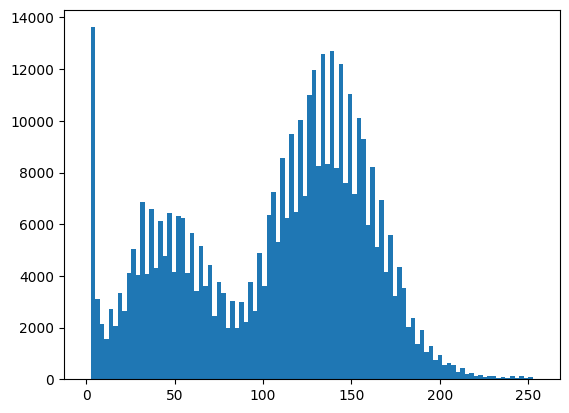

In [ ]:
#Operacion CLAHE en el canal verde
clahe = cv2.createCLAHE(clipLimit=3, tileGridSize=(8,8))
clahe_img = clahe.apply(imgG)
plt.hist(clahe_img.flat, bins=100, range=(0,255))

Text(0.5, 1.0, 'Applying CLAHE')

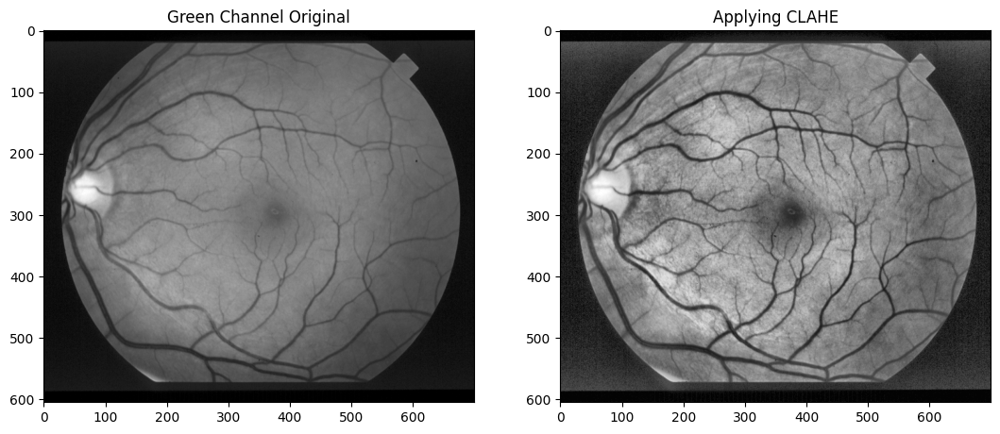

In [ ]:
#Revisando el efecto CLAHE
fig = plt.figure(figsize=(20, 20))
fig.add_subplot(1, 3, 1)
plt.imshow(imgG,cmap='gray')
plt.title('Green Channel Original')
fig.add_subplot(1, 3, 2)
plt.imshow(clahe_img,cmap='gray')
plt.title('Applying CLAHE')

In [ ]:
#Operaciones morfologicas, realizamos opening y despúes closing
cell_disc = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(9,9))
Topen = cv2.morphologyEx(clahe_img,cv2.MORPH_OPEN,cell_disc)
Tclose = cv2.morphologyEx(Topen, cv2.MORPH_CLOSE, cell_disc)
# cell_disc1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))
# Tclose = cv2.morphologyEx(Topen, cv2.MORPH_DILATE, cell_disc1)

#gtting the tophat image
TopHat = (clahe_img - Tclose)#.astype(np.uint8)

Text(0.5, 1.0, 'Green Channel Original')

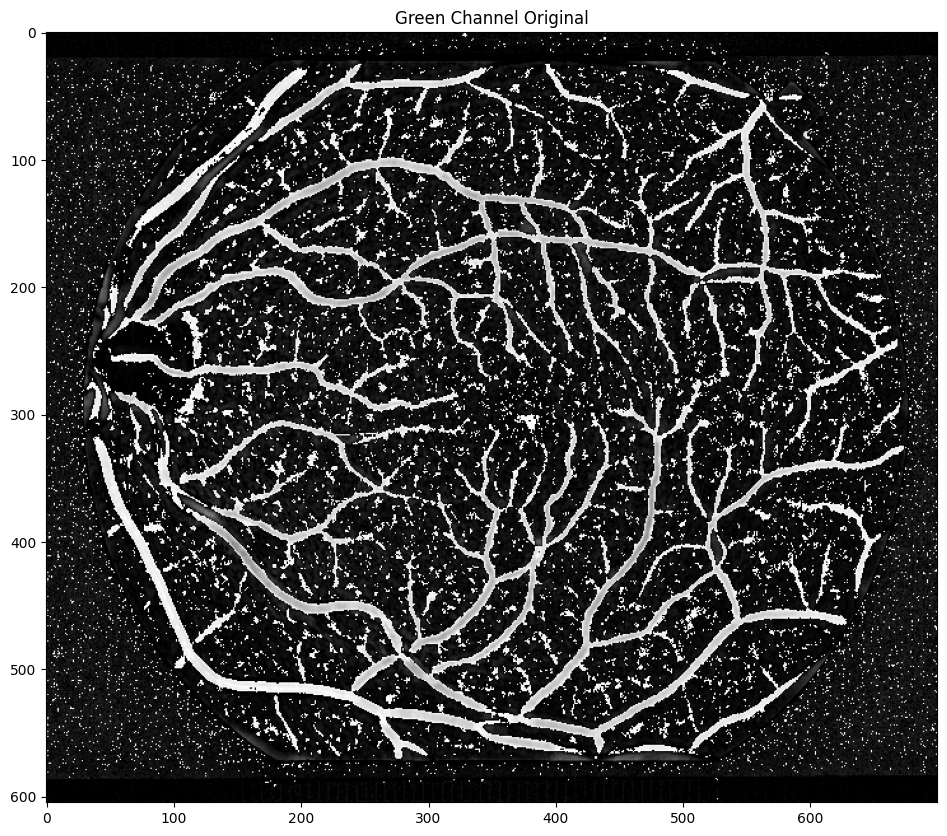

In [ ]:
#Revisando el proceso anterior en la imagen
fig = plt.figure(figsize=(20, 10))
fig.add_subplot(1, 1, 1)
plt.imshow(TopHat,cmap='gray')
plt.title('Green Channel Original')

Text(0.5, 1.0, 'Green Channel Original')

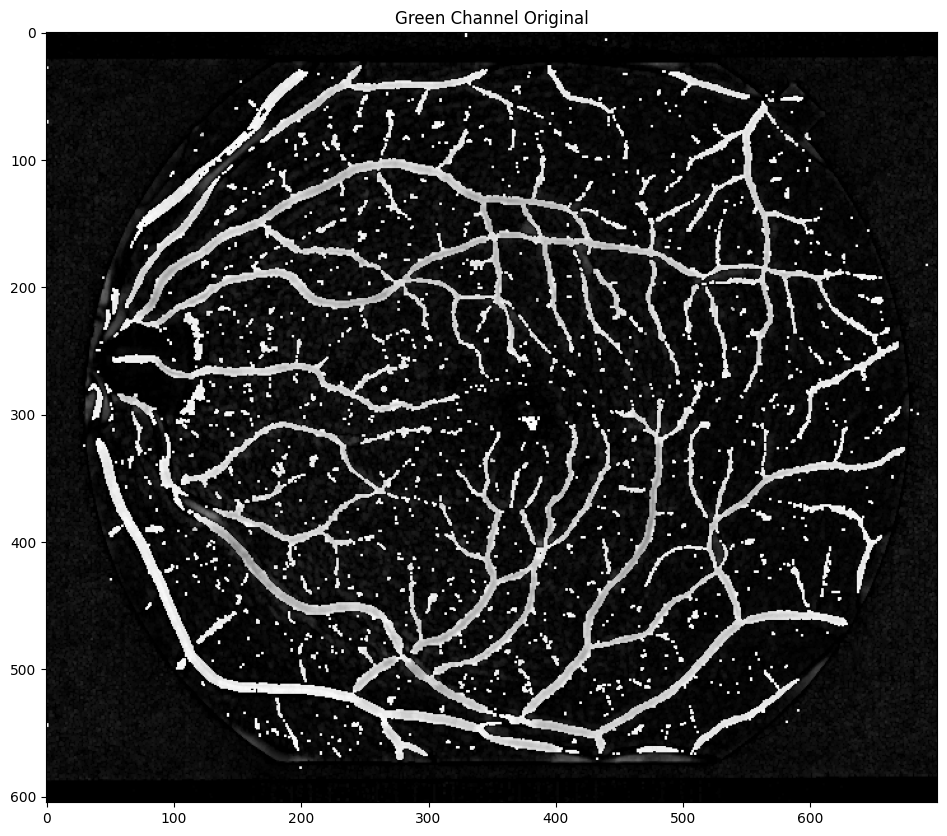

In [ ]:
#Operaciones morfologicas, realizamos erosion y despues dilatacion
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(2,2))
min_image = cv2.erode(TopHat, kernel)
min_image = cv2.dilate(min_image, kernel)
fig = plt.figure(figsize=(20, 10))
fig.add_subplot(1, 1, 1)
plt.imshow(min_image,cmap='gray')
plt.title('Green Channel Original')

## Conclusion

Los anteriores resultados muestran las imágenes que se obtuvieron al realizar diferentes estudios morfológicos.
operaciones para eliminar ruido y detectar límites de los objetos en la imagen dada.

Se puede observar que las imágenes obtenidas por diferentes órdenes de opening y closing dan casi la misma salida.

Se pueden observar diferencias menores en los valores de los píxeles, especialmente en los bordes. Esto es una consecuencia de la presencia de ruido cerca del límite del objeto, y desde que se realizó el cierre.